In [93]:
!pip install missingno
import missingno as msno

!pip install dtale
import dtale

import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

import seaborn as sns
import matplotlib.pyplot as plt


In [94]:
#load data
df = pd.read_csv("data set for smart irrigation sysytem.csv")

In [95]:
# display the first 5 rows of the datset
print(df.head())

          TM         HM      CT    PT     SM
0  27.754298  92.860569  grapes  0.00  79.00
1  27.311557  94.313884  grapes  0.00  72.48
2  28.842710  95.648076  grapes  2.48  78.72
3  26.614235  91.537209  grapes  0.00  67.54
4  29.701432  99.645730  grapes  0.00  72.89


In [96]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2400 entries, 0 to 2399
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   TM      2400 non-null   float64
 1   HM      2397 non-null   float64
 2   CT      2400 non-null   object 
 3   PT      2389 non-null   float64
 4   SM      2397 non-null   float64
dtypes: float64(4), object(1)
memory usage: 93.9+ KB
None


In [97]:
print(df.describe())

                TM           HM           PT           SM
count  2400.000000  2397.000000  2389.000000  2397.000000
mean     26.909159    66.627113     5.398681    46.194072
std       6.190686    23.204924    13.625854    24.127858
min       8.825675    10.034048     0.000000     6.040000
25%      23.459710    57.333898     0.000000    26.720000
50%      26.491525    70.021662     0.000000    42.740000
75%      29.367924    83.518271     4.050000    68.500000
max      49.918224    99.981876   156.860000    90.000000


<Axes: >

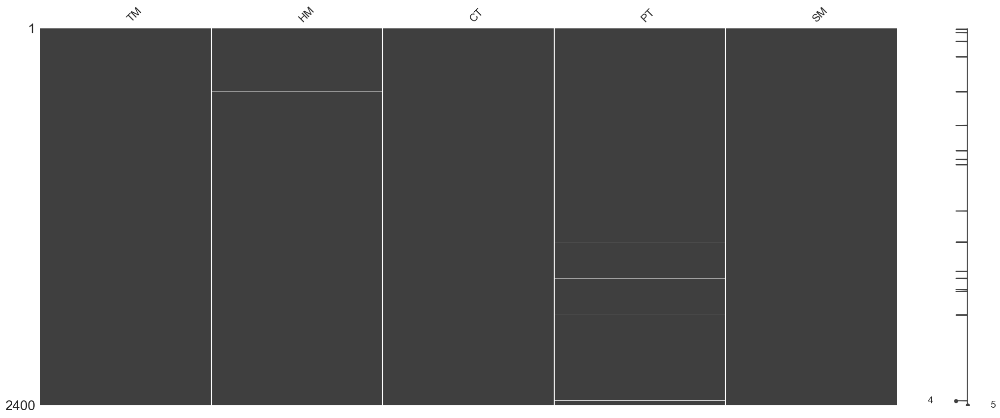

In [98]:
#visualising missing values
msno.matrix(df)

<Axes: >

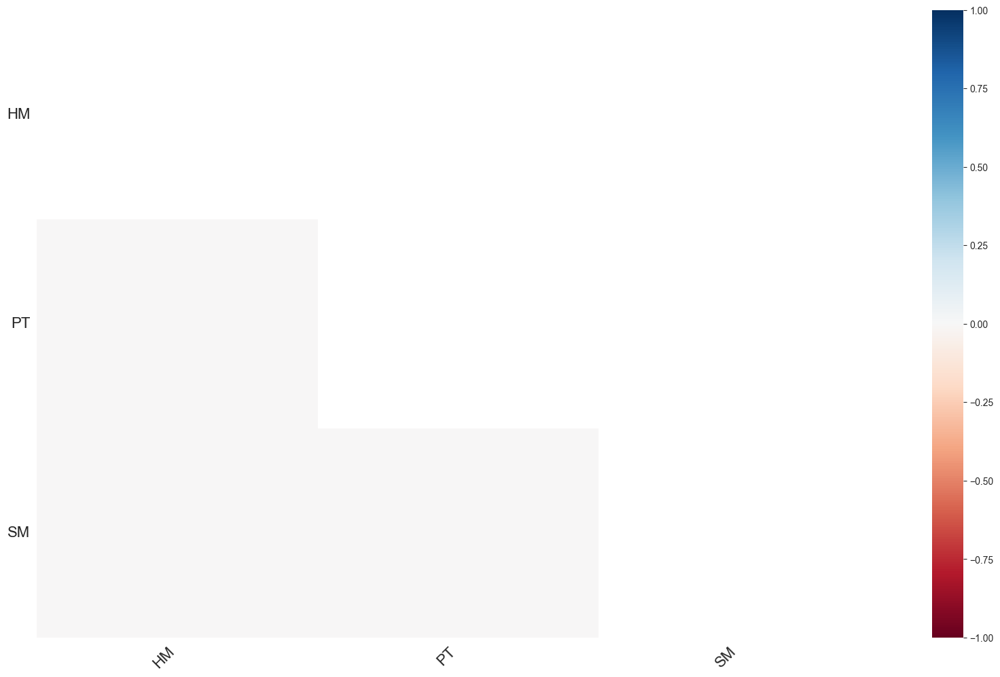

In [99]:
# Generating the heat map for missing values
msno.heatmap(df)

In [100]:
#Exhaustive Summary of dataframe
d = dtale.show(df)

data_frame = d.data
print(data_frame)

             TM         HM      CT     PT     SM
0     27.754298  92.860569  grapes   0.00  79.00
1     27.311557  94.313884  grapes   0.00  72.48
2     28.842710  95.648076  grapes   2.48  78.72
3     26.614235  91.537209  grapes   0.00  67.54
4     29.701432  99.645730  grapes   0.00  72.89
...         ...        ...     ...    ...    ...
2395  17.341502  18.756263   wheat  35.00  41.87
2396  17.437327  14.338474   wheat   0.00  43.44
2397  18.897802  19.761829   wheat   0.00  43.10
2398  18.591908  14.779596   wheat   0.00  38.91
2399  18.315615  15.361435   wheat   4.88  44.48

[2400 rows x 5 columns]


In [101]:
#Counting the instances of a particular values in a column
df.CT.value_counts()

CT
grapes          301
rice            300
Ground Nut      200
maize           200
Jute            200
wheat           200
papaya          200
Tea             200
watermelon      200
Kidney Beans    100
millet          100
Pigeon Peas     100
muskmelon        99
Name: count, dtype: int64

In [102]:
#Handeling missing values
imputer = SimpleImputer(strategy='mean')

#Handeling the missing values in non-categerological columns with their mean
df.iloc[:, [0,1,3,4]] = imputer.fit_transform(df.iloc[:, [0,1,3,4]])

In [103]:
#renaming the coulmns
df.columns = ['Temperature','Humidity','Crop_Type','Pump_Time', 'Soil_moisture']

In [104]:
#Feature Engineering
df['Temp_Humidity_Interaction'] = df ['Temperature']*df['Humidity']

##irrigation needed
df['Irrigation_Needed'] = df['Pump_Time'].apply(lambda x: 1 if x > 0 else 0)


In [105]:
df.head()

,Temperature,Humidity,Crop_Type,Pump_Time,Soil_moisture,Temp_Humidity_Interaction,Irrigation_Needed
0,27.754298,92.860569,grapes,0.00,79.00,2577.279903,0
1,27.311557,94.313884,grapes,0.00,72.48,2575.859018,0
2,28.842710,95.648076,grapes,2.48,78.72,2758.749699,1
3,26.614235,91.537209,grapes,0.00,67.54,2436.192762,0
4,29.701432,99.645730,grapes,0.00,72.89,2959.620871,0


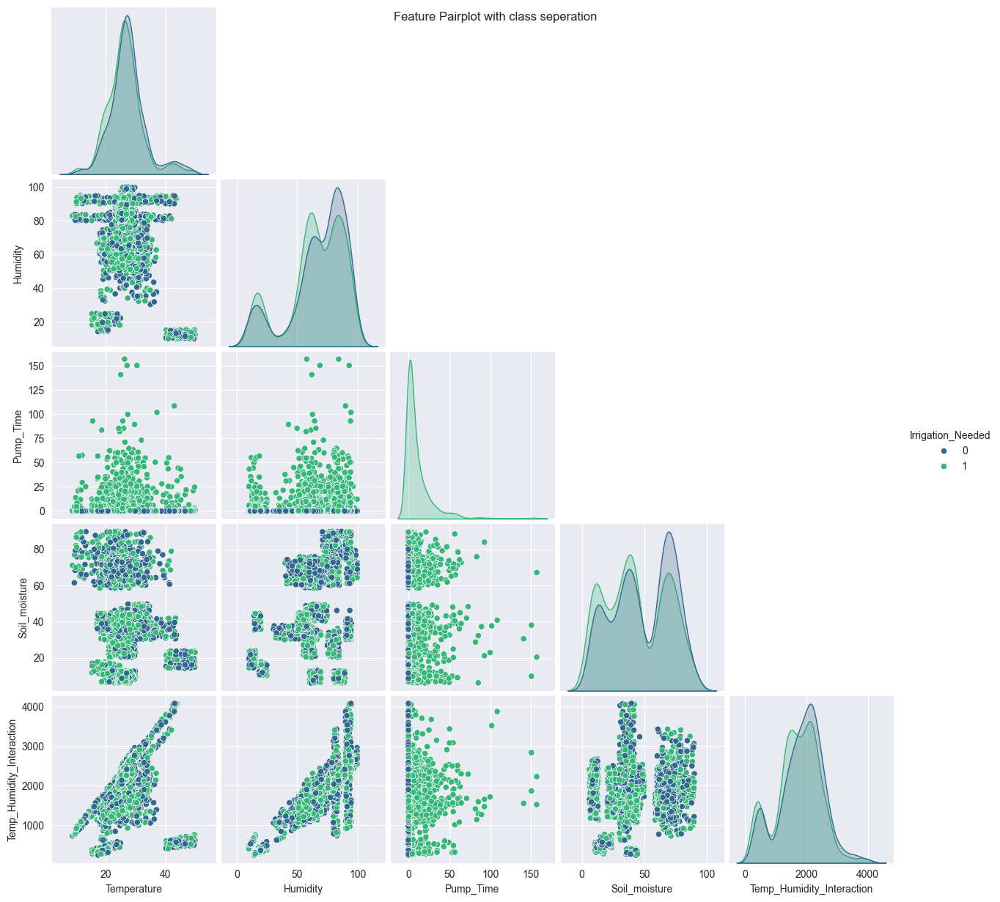

In [106]:
sns.pairplot(df, hue='Irrigation_Needed', palette='viridis', corner=True)
plt.suptitle('Feature Pairplot with class seperation')
plt.show()

In [107]:
#Drop Enginered features

if 'Temp_Humidity_Interaction' in df.columns and 'Irrigation_Needed' in df.columns:
    df.drop(['Temp_Humidity_Interaction',   'Irrigation_Needed'], axis=1, inplace=True)

df.head()

,Temperature,Humidity,Crop_Type,Pump_Time,Soil_moisture
0,27.754298,92.860569,grapes,0.00,79.00
1,27.311557,94.313884,grapes,0.00,72.48
2,28.842710,95.648076,grapes,2.48,78.72
3,26.614235,91.537209,grapes,0.00,67.54
4,29.701432,99.645730,grapes,0.00,72.89


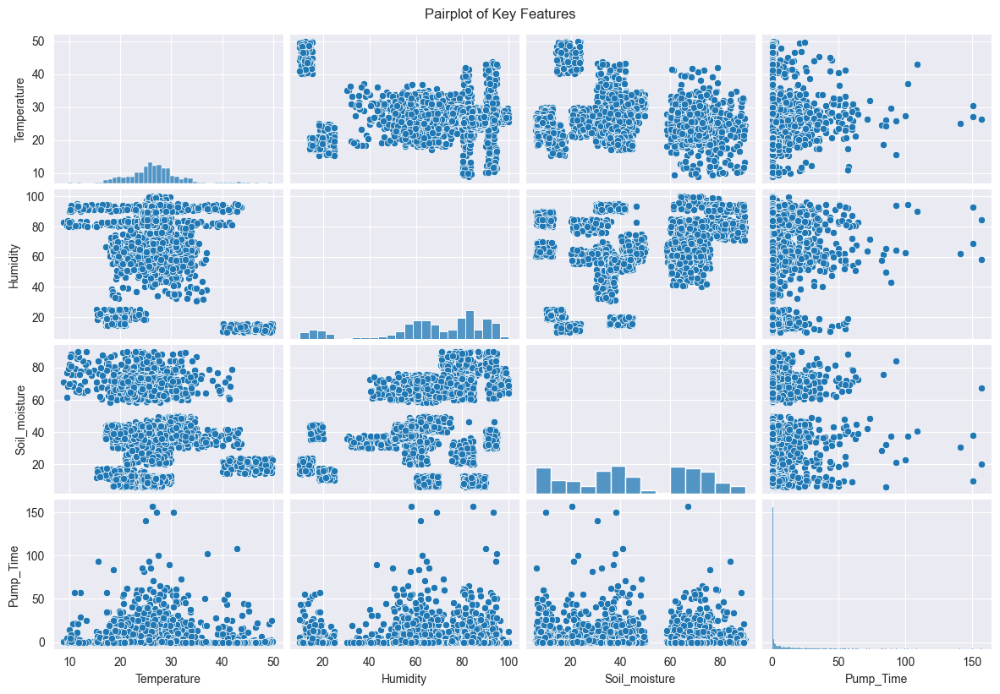

In [108]:
sns.pairplot(df, vars=['Temperature', 'Humidity', 'Soil_moisture', 'Pump_Time'], height=2, aspect=1.5)
plt.suptitle("Pairplot of Key Features", y=1.02)
plt.show()

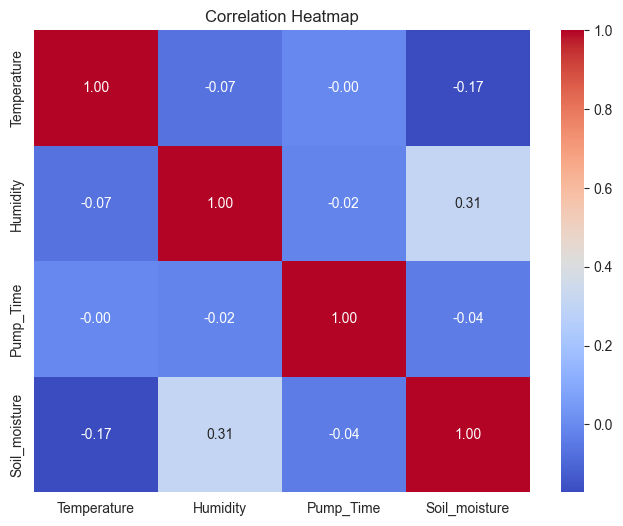

In [109]:
plt.figure(figsize=(8, 6))
# Include only numerical features for correlation calculation
numerical_df = df.select_dtypes(include=np.number)
sns.heatmap(numerical_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

In [110]:
# Interactive 3D plot
import plotly.express as px

fig = px.scatter_3d(df, x='Temperature', y='Humidity', z='Pump_Time',
                    color='Soil_moisture', title='3D Feature Space')
fig.show()

In [111]:
#3D suraface graphs
import plotly.graph_objects as go

fig = go.Figure(data=[go.Surface(z=df[['Temperature', 'Humidity', 'Pump_Time']].values)])

fig.update_layout(
    scene = dict(
        xaxis_title='Temperature',
        yaxis_title='Humidity',
        zaxis_title='Pump_Time'
    )
)

fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                  highlightcolor="limegreen", project_z=True))

fig.show()

In [112]:
# Convert the continuous target variable 'SM' into binary classes (0 or 1)
# Change: Define a threshold for soil moisture and convert SM into binary classes
threshold = 50  # Threshold for low vs high moisture
df['Soil_moisture'] = (df['Soil_moisture'] > threshold).astype(int)  # 1 for high moisture, 0 for low moisture


In [113]:
#Split Dataset

X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

In [114]:
#Encoding the crop types
le = LabelEncoder()
X[:, 2] = le.fit_transform(X[:, 2])

In [115]:
df.head()

,Temperature,Humidity,Crop_Type,Pump_Time,Soil_moisture
0,27.754298,92.860569,grapes,0.00,1
1,27.311557,94.313884,grapes,0.00,1
2,28.842710,95.648076,grapes,2.48,1
3,26.614235,91.537209,grapes,0.00,1
4,29.701432,99.645730,grapes,0.00,1


In [116]:
#View the x Dataest
X.view()

array([[27.754298, 92.86056895, 5, 0.0],
       [27.31155708, 94.3138837, 5, 0.0],
       [28.84270971, 95.64807631, 5, 2.48],
       ...,
       [18.89780215, 19.76182946, 12, 0.0],
       [18.59190771, 14.77959596, 12, 0.0],
       [18.31561493, 15.36143547, 12, 4.88]],
      shape=(2400, 4), dtype=object)

In [117]:
#View the y Dataest
y.view()

array([1, 1, 1, ..., 0, 0, 0], shape=(2400,))

In [118]:
# Split the dataset into training and testing sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [119]:
# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [120]:
# importing the ml models and required accuracy
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [121]:
# Install XGBoost and LightGBM
!pip install xgboost lightgbm

# Import XGBoost, LightGBM, and GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [122]:
# Model Training and Evaluation
# K-Nearest Neighbors (KNN)
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_scaled, y_train)
y_pred_knn = knn.predict(X_test_scaled)

print("KNN Classification Report:")
print(classification_report(y_test, y_pred_knn))
print("KNN Accuracy:", accuracy_score(y_test, y_pred_knn))

KNN Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       275
           1       0.98      0.96      0.97       205

    accuracy                           0.97       480
   macro avg       0.97      0.97      0.97       480
weighted avg       0.97      0.97      0.97       480

KNN Accuracy: 0.9708333333333333


In [123]:
# Decision Tree
dt = DecisionTreeClassifier(random_state=42)
dt.fit(X_train_scaled, y_train)
y_pred_dt = dt.predict(X_test_scaled)

print("Decision Tree Classification Report:")
print(classification_report(y_test, y_pred_dt))
print("Decision Tree Accuracy:", accuracy_score(y_test, y_pred_dt))


Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       275
           1       0.99      1.00      1.00       205

    accuracy                           1.00       480
   macro avg       1.00      1.00      1.00       480
weighted avg       1.00      1.00      1.00       480

Decision Tree Accuracy: 0.9958333333333333


In [124]:
# Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_scaled, y_train)
y_pred_rf = rf.predict(X_test_scaled)

print("Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       275
           1       0.99      1.00      1.00       205

    accuracy                           1.00       480
   macro avg       1.00      1.00      1.00       480
weighted avg       1.00      1.00      1.00       480

Random Forest Accuracy: 0.9958333333333333


In [125]:
# Support Vector Machine (SVM)
svm = SVC(kernel='linear', random_state=42)
svm.fit(X_train_scaled, y_train)
y_pred_svm = svm.predict(X_test_scaled)

print("SVM Classification Report:")
print(classification_report(y_test, y_pred_svm))
print("SVM Accuracy:", accuracy_score(y_test, y_pred_svm))

SVM Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.76      0.72       275
           1       0.62      0.52      0.57       205

    accuracy                           0.66       480
   macro avg       0.65      0.64      0.64       480
weighted avg       0.66      0.66      0.66       480

SVM Accuracy: 0.6604166666666667



--- XGBoost Model ---

XGBoost Model Performance:
Accuracy: 0.9958

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       275
           1       0.99      1.00      1.00       205

    accuracy                           1.00       480
   macro avg       1.00      1.00      1.00       480
weighted avg       1.00      1.00      1.00       480



C:\Users\Satyam\miniconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[00:00:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.




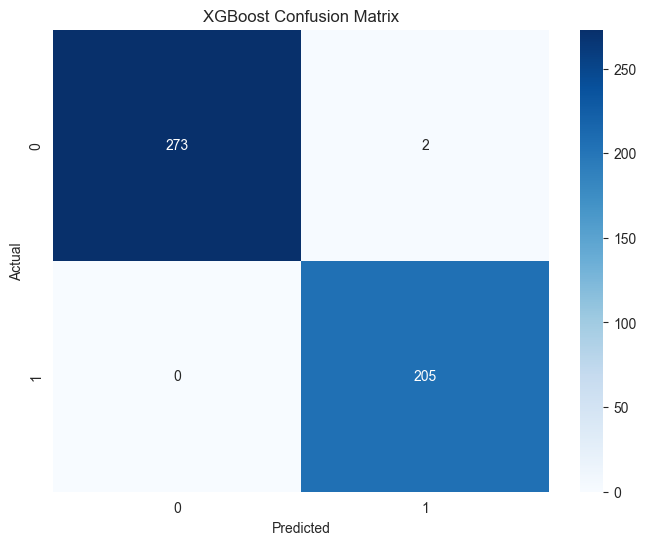

<Figure size 1000x600 with 0 Axes>

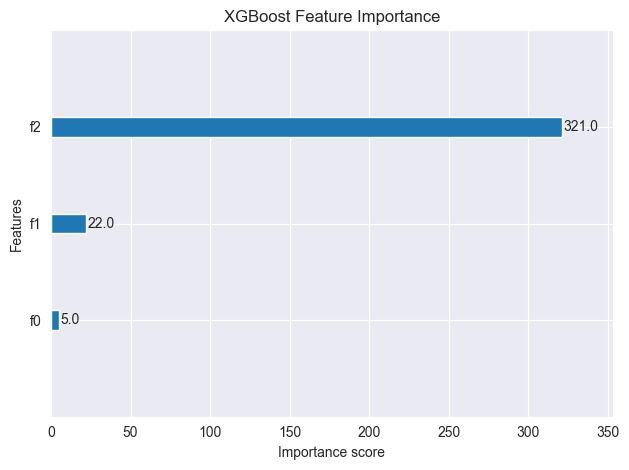

In [126]:
from xgboost import plot_importance

# XGBoost Implementation
print("\n--- XGBoost Model ---")

# Initialize XGBoost model
xgb_model = XGBClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)

# Train the model
xgb_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred_xgb = xgb_model.predict(X_test_scaled)

# Evaluate model performance
print("\nXGBoost Model Performance:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_xgb):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_xgb))

# Confusion Matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_xgb)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('XGBoost Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Feature Importance for XGBoost
plt.figure(figsize=(10, 6))
plot_importance(xgb_model.get_booster(), max_num_features=10)  # Correctly use the underlying booster
plt.title('XGBoost Feature Importance')
plt.tight_layout()


--- LightGBM Model ---

LightGBM Model Performance:
Accuracy: 0.9958

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       275
           1       0.99      1.00      1.00       205

    accuracy                           1.00       480
   macro avg       1.00      1.00      1.00       480
weighted avg       1.00      1.00      1.00       480



C:\Users\Satyam\miniconda3\Lib\site-packages\lightgbm\basic.py:2137: UserWarning:

feature_name keyword has been found in `params` and will be ignored.
Please use feature_name argument of the Dataset constructor to pass this parameter.

C:\Users\Satyam\miniconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names



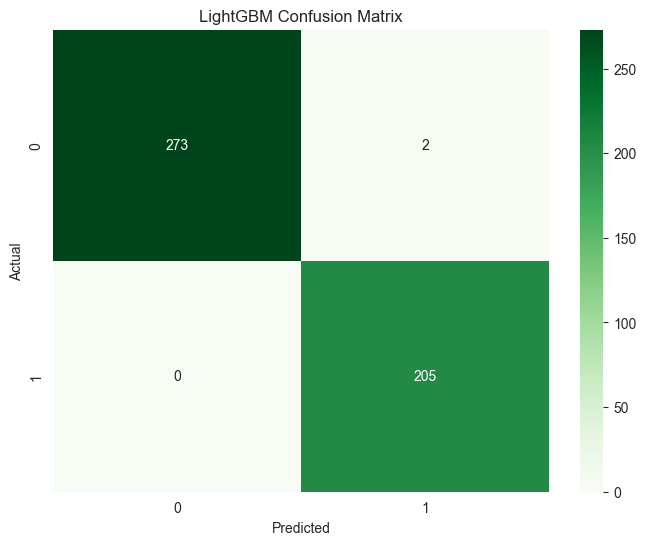

<Figure size 1000x600 with 0 Axes>

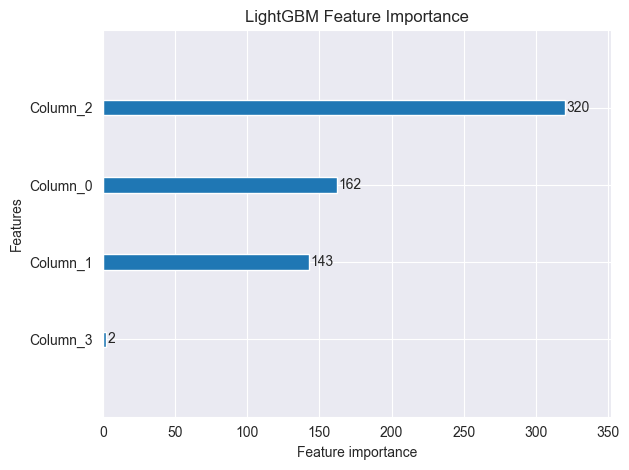

In [127]:
# Import required libraries
import lightgbm as lgb

print("\n--- LightGBM Model ---")


# Initialize LightGBM model
lgb_model = LGBMClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=42,
    verbose=-1,
    feature_name='auto'
)

# Train the model
lgb_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred_lgb = lgb_model.predict(X_test_scaled)

# Evaluate model performance
print("\nLightGBM Model Performance:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_lgb):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_lgb))

# Confusion Matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_lgb)
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens')
plt.title('LightGBM Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Feature Importance for LightGBM
plt.figure(figsize=(10, 6))
lgb.plot_importance(lgb_model, max_num_features=10)
plt.title('LightGBM Feature Importance')
plt.tight_layout()
plt.show()



--- Gradient Boosting Classifier Model ---

Gradient Boosting Model Performance:
Accuracy: 0.9958

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       275
           1       0.99      1.00      1.00       205

    accuracy                           1.00       480
   macro avg       1.00      1.00      1.00       480
weighted avg       1.00      1.00      1.00       480



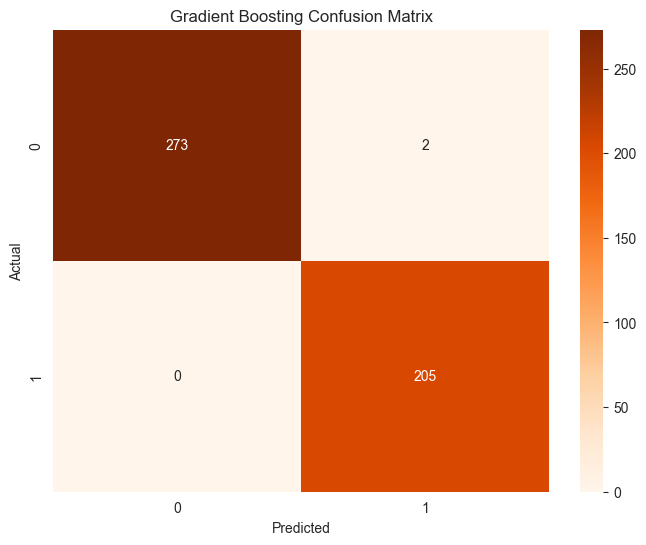

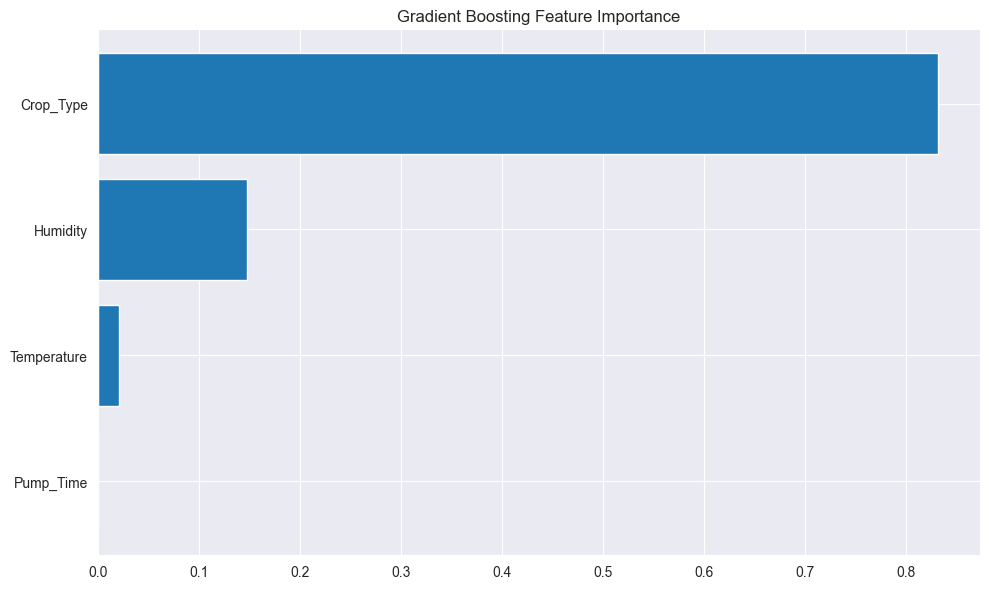

In [128]:
# %%
# Gradient Boosting Classifier Implementation
print("\n--- Gradient Boosting Classifier Model ---")

# Initialize Gradient Boosting model
gb_model = GradientBoostingClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=42
)

# Train the model
gb_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred_gb = gb_model.predict(X_test_scaled)

# Evaluate model performance
print("\nGradient Boosting Model Performance:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_gb):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_gb))

# Confusion Matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_gb)
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges')
plt.title('Gradient Boosting Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Feature Importance for Gradient Boosting
plt.figure(figsize=(10, 6))
feature_importance = gb_model.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), np.array(['Temperature', 'Humidity', 'Crop_Type', 'Pump_Time'])[sorted_idx])
plt.title('Gradient Boosting Feature Importance')
plt.tight_layout()
plt.show()



--- Model Comparison ---
               Model  Accuracy  Precision    Recall  F1-Score
0            XGBoost  0.995833   0.995874  0.995833  0.995836
1           LightGBM  0.995833   0.995874  0.995833  0.995836
2  Gradient Boosting  0.995833   0.995874  0.995833  0.995836


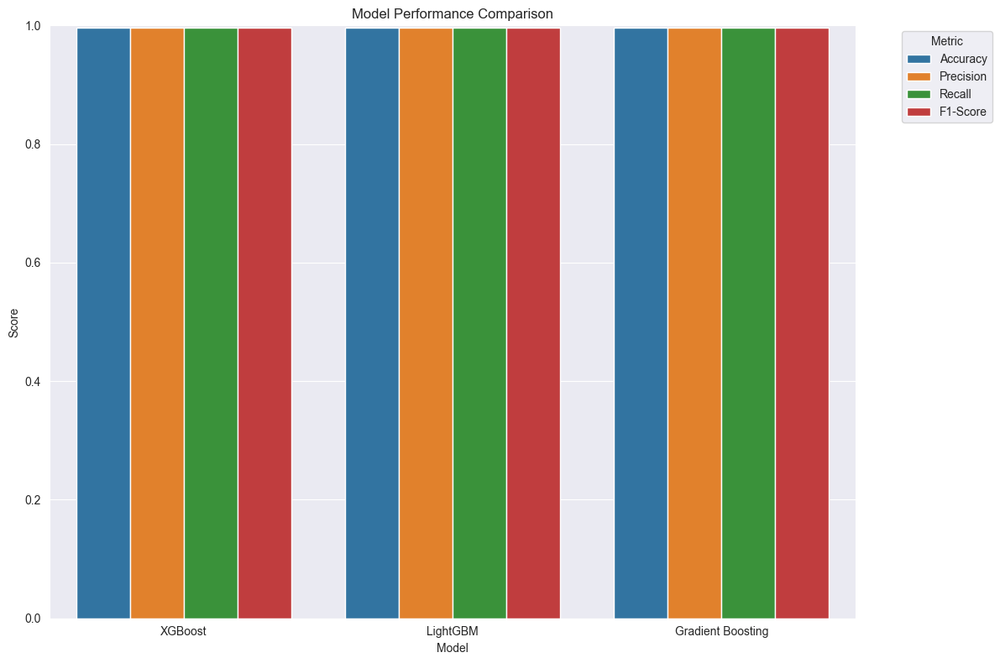

In [129]:
# %%
# Model Comparison
print("\n--- Model Comparison ---")

# Calculate accuracy scores for all models
models = {
    'XGBoost': y_pred_xgb,
    'LightGBM': y_pred_lgb,
    'Gradient Boosting': y_pred_gb
}

# Create a comparison dataframe
comparison = pd.DataFrame(columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1-Score'])

for i, (name, y_pred) in enumerate(models.items()):
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, output_dict=True)
    precision = report['weighted avg']['precision']
    recall = report['weighted avg']['recall']
    f1 = report['weighted avg']['f1-score']

    comparison.loc[i] = [name, accuracy, precision, recall, f1]

# Display comparison results
print(comparison)

# Plot comparison
plt.figure(figsize=(12, 8))
comparison_melted = pd.melt(comparison, id_vars=['Model'], var_name='Metric', value_name='Score')

sns.barplot(x='Model', y='Score', hue='Metric', data=comparison_melted)
plt.title('Model Performance Comparison')
plt.ylim(0, 1.0)
plt.xticks(rotation=0)
plt.legend(title='Metric', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [130]:
# Get the crop type names and their label-encoded values
crop_types = le.classes_
encoded_values = np.arange(len(crop_types))

# Print the results
for crop, value in zip(crop_types, encoded_values):
  print(f"Crop Type: {crop}, Encoded Value: {value}")


Crop Type: Ground Nut, Encoded Value: 0
Crop Type: Jute, Encoded Value: 1
Crop Type: Kidney Beans, Encoded Value: 2
Crop Type: Pigeon Peas, Encoded Value: 3
Crop Type: Tea, Encoded Value: 4
Crop Type: grapes, Encoded Value: 5
Crop Type: maize, Encoded Value: 6
Crop Type: millet, Encoded Value: 7
Crop Type: muskmelon, Encoded Value: 8
Crop Type: papaya, Encoded Value: 9
Crop Type: rice, Encoded Value: 10
Crop Type: watermelon, Encoded Value: 11
Crop Type: wheat, Encoded Value: 12


In [131]:
# Create a sample input for prediction
# TM=27.5, HM=90.0, PT=0, CT='Ground Nut'
sample_input = [[27.5, 90.0, 0, 5]]

sample_input_scaled = scaler.transform(sample_input)


In [132]:
# Predict using the trained models

y_pred_knn = knn.predict(sample_input_scaled)
y_pred_dt = dt.predict(sample_input_scaled)
y_pred_rf = rf.predict(sample_input_scaled)
y_pred_svm = svm.predict(sample_input_scaled)

print("KNN Prediction:", y_pred_knn)
print("Decision Tree Prediction:", y_pred_dt)
print("Random Forest Prediction:", y_pred_rf)
print("SVM Prediction:", y_pred_svm)

KNN Prediction: [1]
Decision Tree Prediction: [0]
Random Forest Prediction: [1]
SVM Prediction: [1]


In [133]:
import pickle

# Save the model to a pickle file
filename = 'ML_IOT.pkl'
pickle.dump(rf, open(filename, 'wb'))